# Stock - Bond Correlation and Yield levels

This research notebook examines the Stock-Bond correlation behavior and corresponding yield levels. 
The correlation between stocks and bonds is changing over time, sometimes it is positive, sometimes it is negative. This creates a challenge from an asset management standpoint, as the changing correlation provides especially 60-40 and risk parity portfolios big problems. 

In [1]:
# Hide the code in jupyter notebook
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')



In [2]:
# imports
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt 
import yfinance as yf
import missingno as msno

In [3]:
plt.rcParams['figure.dpi'] = 300
sns.set(rc={"figure.dpi":300, 'savefig.dpi':300})
sns.set_context('notebook')
sns.set_style("ticks")

**Downloading and showing data**

In [4]:
data = yf.download(['^GSPC', '^FVX', '^TNX', '^TYX'], start='1960-01-01')['Close']

[*********************100%***********************]  4 of 4 completed


In [5]:
data

,^FVX,^GSPC,^TNX,^TYX
Date,,,,
1959-12-31,NaN,59.889999,NaN,NaN
1960-01-04,NaN,59.910000,NaN,NaN
1960-01-05,NaN,60.389999,NaN,NaN
1960-01-06,NaN,60.130001,NaN,NaN
1960-01-07,NaN,59.689999,NaN,NaN
...,...,...,...,...
2022-04-25,2.859,4296.120117,2.826,2.894
2022-04-26,2.797,4175.200195,2.772,2.869
2022-04-27,2.815,4183.959961,2.818,2.908


**Visualizing missing values**

<AxesSubplot:>

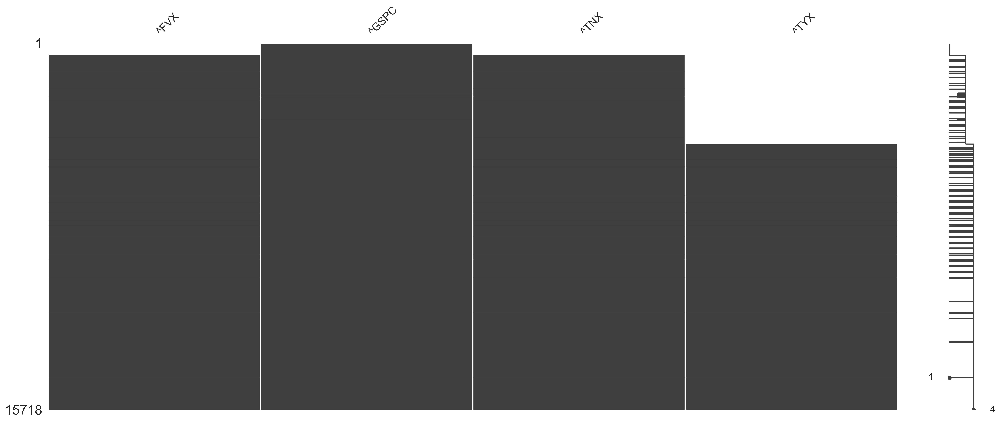

In [6]:
msno.matrix(data)

In [7]:
data = data.dropna()

**Calculating correlations**

In [17]:
data['TNX_SP500_CORR'] = data['^GSPC'].pct_change().rolling(20).corr(data['^TNX'].pct_change())
data['TYX_SP500_CORR'] = data['^GSPC'].pct_change().rolling(20).corr(data['^TYX'].pct_change())
data['FVX_SP500_CORR'] = data['^GSPC'].pct_change().rolling(20).corr(data['^FVX'].pct_change())

/var/folders/70/wlkw8m0d7ls5hgplpk5b0btr0000gn/T/ipykernel_2379/242021926.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['TNX_SP500_CORR'] = data['^GSPC'].pct_change().rolling(20).corr(data['^TNX'].pct_change())
/var/folders/70/wlkw8m0d7ls5hgplpk5b0btr0000gn/T/ipykernel_2379/242021926.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['TYX_SP500_CORR'] = data['^GSPC'].pct_change().rolling(20).corr(data['^TYX'].pct_change())
/var/folders/70/wlkw8m0d7ls5hgplpk5b0btr0000gn/T/ipykernel_2379/2420

### 5 year yields and correlation between equities and 5 year yields

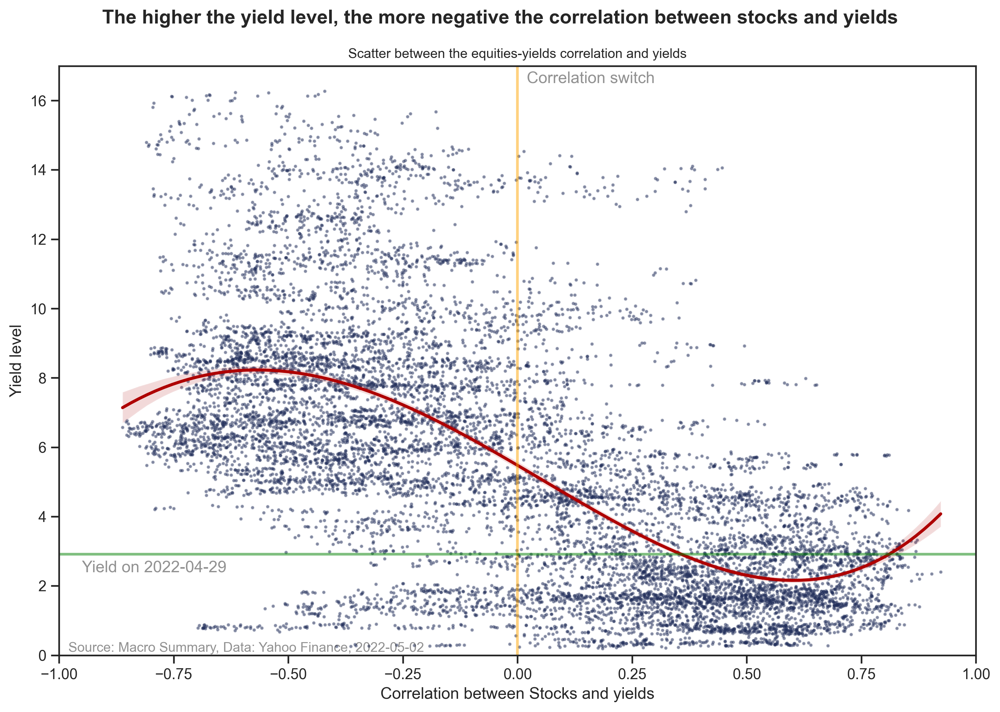

In [16]:
# Plot scatterplot
fig, ax = plt.subplots()
fig.set_size_inches(10.5, 7.5)

_ = sns.regplot(
    x=data['FVX_SP500_CORR'], 
    y=data['^FVX'], 
    order = 4,
    scatter_kws={'alpha':0.4, 
                 's':10, 
                 "color": "#222f5b"}, 
    line_kws={"color": "#ae0001",
             'alpha':1}, 
    marker='.',
)

plt.axvline(
    x = 0,
    color = "orange",
    lw = 2,
    alpha=0.5,
)
ax.text(0.02, 16.5, "Correlation switch", alpha = 0.5)

plt.axhline(
    y = data['^FVX'].iloc[-1],
    color = "green",
    lw = 2,
    alpha=0.5,
)
ax.text(-0.95, 2.4, "Yield on 2022-04-29", alpha = 0.5)

# Set labels
_.set(xlabel='Correlation between Stocks and yields', 
      ylabel='Yield level', 
      ylim=(0, 17), 
      xlim=(-1, 1)
     )

# Set title
_ = plt.suptitle(f'The higher the yield level, the more negative the correlation between stocks and yields', fontweight="bold")
_ = plt.title(f'Scatter between the equities-yields correlation and yields', fontsize = 10)

_ = ax.text(-0.98, 0.1, "Source: Macro Summary, Data: Yahoo Finance, 2022-05-02", alpha = 0.5, fontsize=10)

_.figure.tight_layout()
_ = plt.show()

### 10 year yields and correlation between equities and 10 year yields

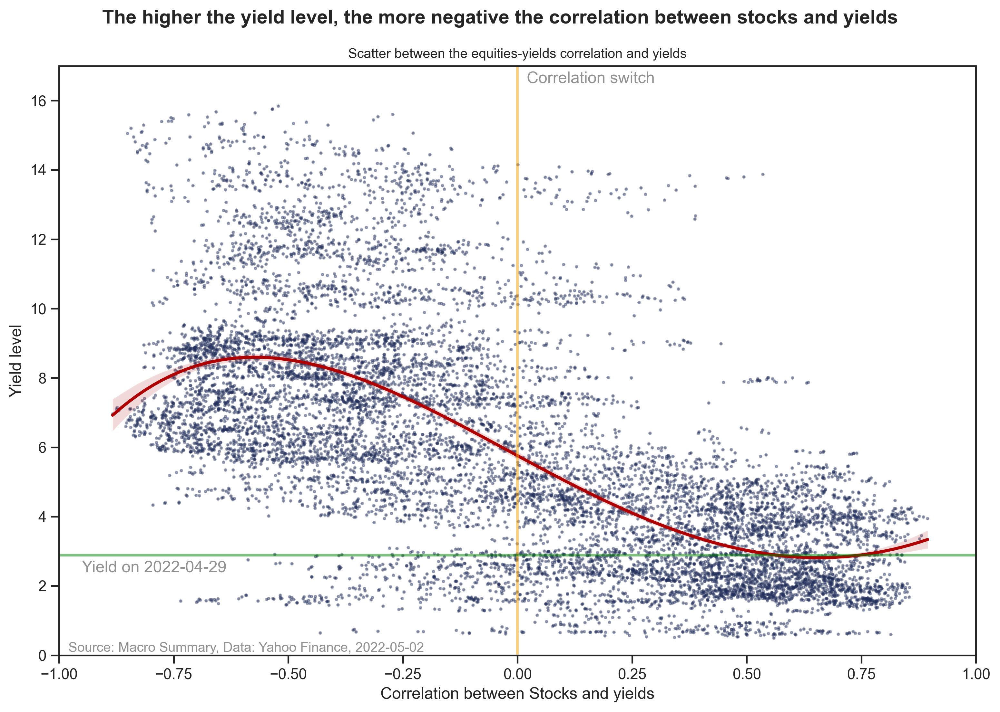

In [10]:
# Plot scatterplot
fig, ax = plt.subplots()
fig.set_size_inches(10.5, 7.5)

_ = sns.regplot(
    x=data['TNX_SP500_CORR'], 
    y=data['^TNX'], 
    order = 4,
    scatter_kws={'alpha':0.4, 
                 's':10, 
                 "color": "#222f5b"}, 
    line_kws={"color": "#ae0001",
             'alpha':1}, 
    marker='.',
)

plt.axvline(
    x = 0,
    color = "orange",
    lw = 2,
    alpha=0.5,
)
ax.text(0.02, 16.5, "Correlation switch", alpha = 0.5)

plt.axhline(
    y = data['^TNX'].iloc[-1],
    color = "green",
    lw = 2,
    alpha=0.5,
)
ax.text(-0.95, 2.4, "Yield on 2022-04-29", alpha = 0.5)

# Set labels
_.set(xlabel='Correlation between Stocks and yields', 
      ylabel='Yield level', 
      ylim=(0, 17), 
      xlim=(-1, 1)
     )

# Set title
_ = plt.suptitle(f'The higher the yield level, the more negative the correlation between stocks and yields', fontweight="bold")
_ = plt.title(f'Scatter between the equities-yields correlation and yields', fontsize = 10)

_ = ax.text(-0.98, 0.1, "Source: Macro Summary, Data: Yahoo Finance, 2022-05-02", alpha = 0.5, fontsize=10)

_.figure.tight_layout()
_ = plt.show()

### 30 year yields and correlation between equities and 30 year yields

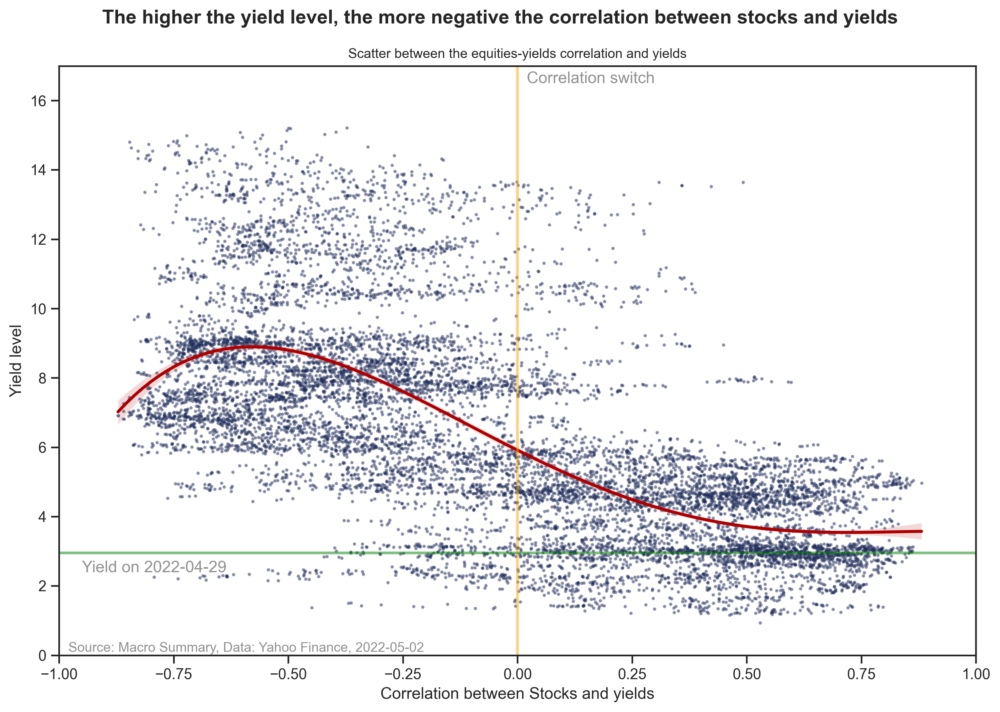

In [11]:
# Plot scatterplot
fig, ax = plt.subplots()
fig.set_size_inches(10.5, 7.5)

_ = sns.regplot(
    x=data['TYX_SP500_CORR'], 
    y=data['^TYX'], 
    order = 4,
    scatter_kws={'alpha':0.4, 
                 's':10, 
                 "color": "#222f5b"}, 
    line_kws={"color": "#ae0001",
             'alpha':1}, 
    marker='.',
)

plt.axvline(
    x = 0,
    color = "orange",
    lw = 2,
    alpha=0.5,
)
ax.text(0.02, 16.5, "Correlation switch", alpha = 0.5)

plt.axhline(
    y = data['^TYX'].iloc[-1],
    color = "green",
    lw = 2,
    alpha=0.5,
)
ax.text(-0.95, 2.4, "Yield on 2022-04-29", alpha = 0.5)

# Set labels
_.set(xlabel='Correlation between Stocks and yields', 
      ylabel='Yield level', 
      ylim=(0, 17), 
      xlim=(-1, 1)
     )

# Set title
_ = plt.suptitle(f'The higher the yield level, the more negative the correlation between stocks and yields', fontweight="bold")
_ = plt.title(f'Scatter between the equities-yields correlation and yields', fontsize = 10)

_ = ax.text(-0.98, 0.1, "Source: Macro Summary, Data: Yahoo Finance, 2022-05-02", alpha = 0.5, fontsize=10)

_.figure.tight_layout()
_ = plt.show()

# All together (messy)

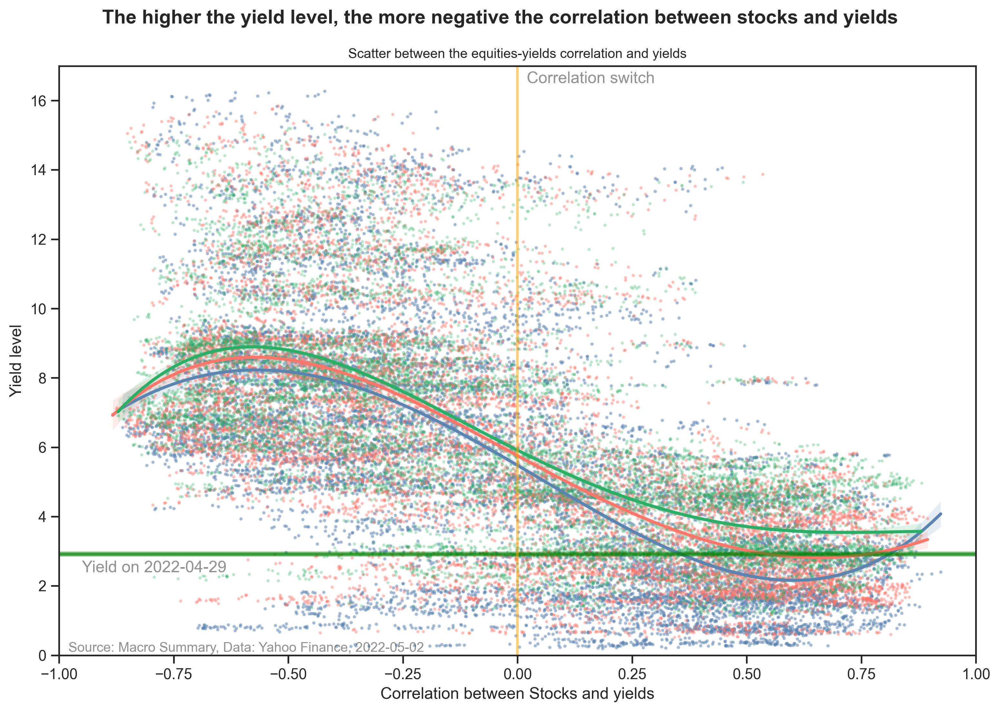

In [12]:
# Plot scatterplot
fig, ax = plt.subplots()
fig.set_size_inches(10.5, 7.5)


# 5 year
_ = sns.regplot(
    x=data['FVX_SP500_CORR'], 
    y=data['^FVX'], 
    order = 4,
    scatter_kws={'alpha':0.4, 
                 's':10, 
                 "color": "#5B84B1FF"}, 
    line_kws={"color": "#5B84B1FF",
             'alpha':1}, 
    marker='.',
)

plt.axhline(
    y = data['^FVX'].iloc[-1],
    color = "green",
    lw = 2,
    alpha=0.5,
)

#10 year
_ = sns.regplot(
    x=data['TNX_SP500_CORR'], 
    y=data['^TNX'], 
    order = 4,
    scatter_kws={'alpha':0.3, 
                 's':10, 
                 "color": "#FC766AFF"}, 
    line_kws={"color": "#FC766AFF",
             'alpha':1}, 
    marker='.',
)

plt.axhline(
    y = data['^TNX'].iloc[-1],
    color = "green",
    lw = 2,
    alpha=0.5,
)


# 30 year
_ = sns.regplot(
    x=data['TYX_SP500_CORR'], 
    y=data['^TYX'], 
    order = 4,
    scatter_kws={'alpha':0.2, 
                 's':10, 
                 "color": "#2BAE66FF"}, 
    line_kws={"color": "#2BAE66FF",
             'alpha':1}, 
    marker='.',
)

plt.axhline(
    y = data['^TYX'].iloc[-1],
    color = "green",
    lw = 2,
    alpha=0.5,
)



plt.axvline(
    x = 0,
    color = "orange",
    lw = 2,
    alpha=0.5,
)
ax.text(0.02, 16.5, "Correlation switch", alpha = 0.5)
ax.text(-0.95, 2.4, "Yield on 2022-04-29", alpha = 0.5)

# Set labels
_.set(xlabel='Correlation between Stocks and yields', 
      ylabel='Yield level', 
      ylim=(0, 17), 
      xlim=(-1, 1)
     )

# Set title
_ = plt.suptitle(f'The higher the yield level, the more negative the correlation between stocks and yields', fontweight="bold")
_ = plt.title(f'Scatter between the equities-yields correlation and yields', fontsize = 10)

_ = ax.text(-0.98, 0.1, "Source: Macro Summary, Data: Yahoo Finance, 2022-05-02", alpha = 0.5, fontsize=10)

_.figure.tight_layout()
_ = plt.show()